# Прекод

# Сборный проект-4

Вам поручено разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

### Описание данных

Данные лежат в папке `/datasets/image_search/` или доступны по [ссылке](https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip).

В файле `train_dataset.csv` находится информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `train_images` содержатся изображения для тренировки модели.

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле `test_queries.csv` находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `test_images` содержатся изображения для тестирования модели.

## Исследовательский анализ данных

Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи вы должны эти оценки агрегировать — превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета.

Вы можете воспользоваться другим методом агрегации оценок или придумать свой.

В файле с краудсорсинговыми оценками информация расположена в таком порядке:

1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке.
2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.

После анализа экспертных и краудсорсинговых оценок выберите либо одну из них, либо объедините их в одну по какому-то критерию: например, оценка эксперта принимается с коэффициентом 0.6, а крауда — с коэффициентом 0.4.

Ваша модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.


In [1]:
#!pip install -q image-classifiers 

In [2]:
import pandas as pd
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from tqdm.notebook import tqdm
from tqdm import tqdm
tqdm.pandas()

import nltk
import re
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords, wordnet
from sklearn.feature_extraction.text import TfidfVectorizer
from pytorch_transformers import BertTokenizer
from keras_preprocessing.sequence import pad_sequences
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler
nltk.download('stopwords') 
nltk.download('punkt') 
nltk.download('wordnet') 
nltk.download('omw-1.4')

from tensorflow.keras.metrics import RootMeanSquaredError
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet import ResNet50
from classification_models.keras import Classifiers
from keras.applications.resnet50 import preprocess_input
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, GlobalAveragePooling2D, Conv2D, MaxPooling2D, BatchNormalization, Reshape, RepeatVector, LSTM, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow import keras
import tensorflow as tf

from sklearn.model_selection import train_test_split
from sklearn.model_selection import GroupShuffleSplit
from sklearn.model_selection import GridSearchCV 
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.linear_model import LogisticRegression, LinearRegression, Ridge
from sklearn.svm import LinearSVR
from sklearn.tree import DecisionTreeRegressor
from lightgbm import LGBMRegressor
from sklearn.pipeline import make_pipeline

from PIL import Image
from pathlib import Path

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\VMP.PC\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\VMP.PC\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\VMP.PC\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\VMP.PC\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


In [3]:
# Зададим константы
RS = 42
WORD_TO_BLOCK = ['girl', 'boy', 'kid', 'teenage', 'baby', 'child', 'teenager', 'children', 'young boy', 'young girl']
DATA_PATH = 'C:/Users/VMP.PC/Downloads/'
PATH = 'C://Users//VMP.PC//Downloads//dsplus_integrated_project_4_1//to_upload//'

In [4]:
# Распакуем наши датаметы
df_train = pd.read_csv(os.path.join(DATA_PATH, 'train_dataset.csv'))

df_crowd = pd.read_csv(os.path.join(DATA_PATH, 'CrowdAnnotations.tsv'), sep='\t',
                           names=['image', 'query_id', 'share_pos', 'count_pos', 'count_neg'])

df_expert = pd.read_csv(os.path.join(DATA_PATH, 'ExpertAnnotations.tsv'), sep='\t',
                           names=['image', 'query_id', 'first', 'second', 'third'])

df_queries = pd.read_csv(os.path.join(DATA_PATH, 'test_queries.csv'), index_col=[0], sep='|')

df_images = pd.read_csv(os.path.join(DATA_PATH, 'test_images.csv'), sep='|')

In [5]:
# Функция обработки данных
def data_analysis(data):
    print("Информация о датасете:")
    data.info()
    print("Первые 5 строк:")
    display(data.head())
    print("Описание данных:")
    display(data.describe())
    print("Количество повторяющихся строк:")
    display(data.duplicated().sum())
    print("Процент пропущенных значений по столбцу:")
    display(round(data.isna().mean() * 100, 2))

In [6]:
data_analysis(df_train)

Информация о датасете:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB
Первые 5 строк:


,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


Описание данных:


,image,query_id,query_text
count,5822,5822,5822
unique,1000,977,977
top,3364151356_eecd07a23e.jpg,2600867924_cd502fc911.jpg#2,"Two dogs , one brown and white and one black a..."
freq,10,34,34


Количество повторяющихся строк:


0

Процент пропущенных значений по столбцу:


image         0.0
query_id      0.0
query_text    0.0
dtype: float64

In [7]:
data_analysis(df_crowd)

Информация о датасете:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   image      47830 non-null  object 
 1   query_id   47830 non-null  object 
 2   share_pos  47830 non-null  float64
 3   count_pos  47830 non-null  int64  
 4   count_neg  47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB
Первые 5 строк:


,image,query_id,share_pos,count_pos,count_neg
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3


Описание данных:


,share_pos,count_pos,count_neg
count,47830.000000,47830.000000,47830.000000
mean,0.068786,0.208488,2.820155
std,0.207532,0.628898,0.656676
min,0.000000,0.000000,0.000000
25%,0.000000,0.000000,3.000000
50%,0.000000,0.000000,3.000000
75%,0.000000,0.000000,3.000000
max,1.000000,5.000000,6.000000


Количество повторяющихся строк:


0

Процент пропущенных значений по столбцу:


image        0.0
query_id     0.0
share_pos    0.0
count_pos    0.0
count_neg    0.0
dtype: float64

In [8]:
data_analysis(df_expert)

Информация о датасете:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   first     5822 non-null   int64 
 3   second    5822 non-null   int64 
 4   third     5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.6+ KB
Первые 5 строк:


,image,query_id,first,second,third
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


Описание данных:


,first,second,third
count,5822.000000,5822.000000,5822.000000
mean,1.436620,1.624356,1.881999
std,0.787084,0.856222,0.904087
min,1.000000,1.000000,1.000000
25%,1.000000,1.000000,1.000000
50%,1.000000,1.000000,2.000000
75%,2.000000,2.000000,2.000000
max,4.000000,4.000000,4.000000


Количество повторяющихся строк:


0

Процент пропущенных значений по столбцу:


image       0.0
query_id    0.0
first       0.0
second      0.0
third       0.0
dtype: float64

In [9]:
data_analysis(df_queries)

Информация о датасете:
<class 'pandas.core.frame.DataFrame'>
Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB
Первые 5 строк:


,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg


Описание данных:


,query_id,query_text,image
count,500,500,500
unique,500,500,100
top,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
freq,1,1,5


Количество повторяющихся строк:


0

Процент пропущенных значений по столбцу:


query_id      0.0
query_text    0.0
image         0.0
dtype: float64

In [10]:
data_analysis(df_images)

Информация о датасете:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 932.0+ bytes
Первые 5 строк:


,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg
3,1429546659_44cb09cbe2.jpg
4,1177994172_10d143cb8d.jpg


Описание данных:


,image
count,100
unique,100
top,3356748019_2251399314.jpg
freq,1


Количество повторяющихся строк:


0

Процент пропущенных значений по столбцу:


image    0.0
dtype: float64

In [11]:
print('Количество уникальных фото в тренировочной выборке:', len(df_train['image'].unique()))
print('Количество уникальных фото в тестовой выборке:', len(df_images['image'].unique()))
print('Уникальные картинки, которые есть в обоих наборах:', len(set(df_train['image']) & set(df_queries['image'])))

Количество уникальных фото в тренировочной выборке: 1000
Количество уникальных фото в тестовой выборке: 100
Уникальные картинки, которые есть в обоих наборах: 0


In [12]:
print('Количество уникальных текстовых описаний в тренировочной выборке:', len(set(df_train['query_text'])))
print('Количество уникальных текстовых описаний в тестовой выборке:', len(set(df_queries['query_text'])))
print('Уникальные текстовые описания, которые есть в обоих наборах:', len(set(df_train['query_text']) & set(df_queries['query_text'])))

Количество уникальных текстовых описаний в тренировочной выборке: 977
Количество уникальных текстовых описаний в тестовой выборке: 500
Уникальные текстовые описания, которые есть в обоих наборах: 0


In [13]:
print(f'Размер обучающего набора данных - изображения:')
display(df_train.shape)
print(f'Размер обучающего набора данных - краудсорсинг:')
display(df_crowd.shape)
print(f'Размер обучающего набора данных - опрос экспертов:')
display(df_expert.shape)
print(f'Размер тестового набора данных - запросы:')
display(df_queries.shape)
print(f'Размер тестового набора данных - изображения:')
display(df_images.shape)

Размер обучающего набора данных - изображения:


(5822, 3)

Размер обучающего набора данных - краудсорсинг:


(47830, 5)

Размер обучающего набора данных - опрос экспертов:


(5822, 5)

Размер тестового набора данных - запросы:


(500, 3)

Размер тестового набора данных - изображения:


(100, 1)

Выведение на экран изображения из тренировочного и тестового набора данных:

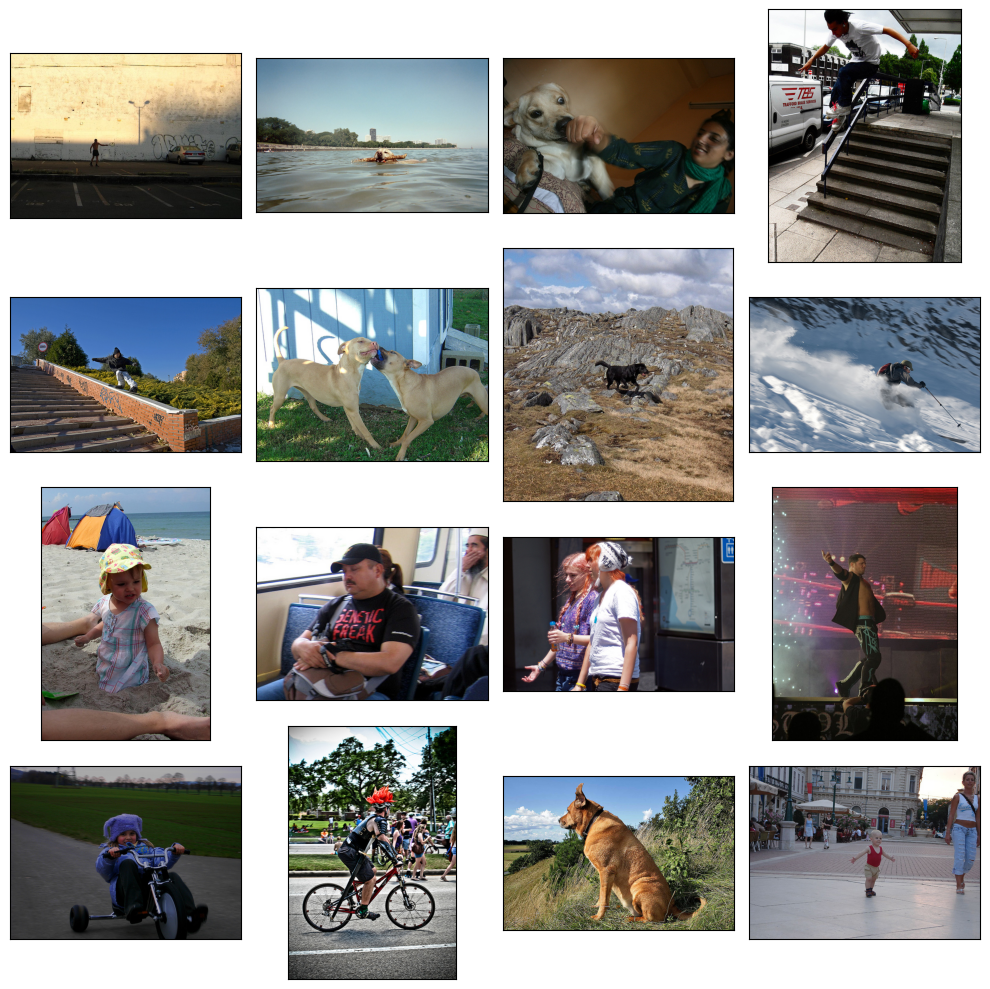

In [14]:
train = list(df_train['image'].sample(8))
test = list(df_queries['image'].sample(8))

# Изображения из тренировочной выборки
fig = plt.figure(figsize=(10,10))
for i in range(8):
    fig.add_subplot(4, 4, i+1)
    image = Image.open(Path(PATH, 'train_images', train[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
 
# Изображения из тестовой выборки
for i in range(8):
    fig.add_subplot(4, 4, i+9)
    image = Image.open(Path(PATH, 'test_images', test[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

### Вывод
В рамках данной работы нам было предоставлено 5-ть датасетов.

Датасет **df_train** содержит:  
- 3 категориальных признака: image, query_id и query_text.  
- 1000 уникальных изображений и 977 уникальных текстовых описаний.  
Всего: 5822 записей

Датасет **df_crowd** содержит:
- 3 численных признака: share_pos, count_pos, count_neg
- 2 категориальных признака: image, query_id
- 1000 уникальных изображений  
Всего: 47830 записей

Датасет **df_expert** содержит:
- 3 численных признака: first, second, third (оценки трёх экспертов по шкале от 1 до 4)
- 2 категориальных признака: image, query_id
- 1000 уникальных изображений и 977 уникальных текстовых описаний.  
Всего: 5822 записей

Датасет **df_queries** содержит:
- 3 категориальных признака: image, query_id и query_text.
- 100 уникальных изображений и 500 уникальных текстовых описаний.  
Всего: 500 записей

Датасет **df_images** содержит:
- 1 категориальный признак: image
- 100 уникальных изображений  
Всего: 100 записей

В ходе работы с данными были обнаружены следующие моменты:
1) Наименование столбцов корректны.  
2) Типы данных - корректны.  
3) Пропуски и явные дубликаты отсутствуют.

Пересечений между наборами данных для тренировки и теста модели не обнаружено. Для каждой тестовой картинки было представлено по 5 описаний. **Предоработка данных не требуется**

## Агрегация оценок

### Агрегация мнений экспертов

Уникальные значения от 1 до 4

In [15]:
# Изображения и описания, полученные в результате опроса экспертов
def avg_expert(row):
    if row['first'] == row['second'] == row['third']:
        row['avg_expert'] = row['first']
    else:
        row['avg_expert'] = int(np.median(row['first':'third']))
    return row  
df_expert = df_expert.progress_apply(avg_expert, axis=1)

# Проверка 
print(f"Колличество уникальных изображений: {df_expert['image'].nunique()}")
df_expert.sample(5)

100%|████████████████████████████████████████████████████████████████████████████| 5822/5822 [00:02<00:00, 2064.91it/s]

Колличество уникальных изображений: 1000


,image,query_id,first,second,third,avg_expert
2082,270816949_ffad112278.jpg,3316725440_9ccd9b5417.jpg#2,1,1,2,1
4940,3697359692_8a5cdbe4fe.jpg,3220126881_b0a4f7cccb.jpg#2,1,1,1,1
2696,2991994607_06f24ec7a6.jpg,3197981073_3156963446.jpg#2,1,1,2,1
5180,429851331_b248ca01cd.jpg,997722733_0cb5439472.jpg#2,1,1,1,1
2991,3106026005_473a7b1c8c.jpg,2248487950_c62d0c81a9.jpg#2,1,1,2,1


In [16]:
# Удаление столбцов с оценками экспертов
df_expert = df_expert.drop(df_expert.columns[-4:-1], axis=1)

In [17]:
print(f"Колличество уникальных изображений: {df_expert['image'].nunique()}")
df_expert.sample(5)

Колличество уникальных изображений: 1000


,image,query_id,avg_expert
577,180094434_b0f244832d.jpg,3729525173_7f984ed776.jpg#2,1
3920,3375070563_3c290a7991.jpg,3227148358_f152303584.jpg#2,4
386,1456393634_74022d9056.jpg,533483374_86c5d4c13e.jpg#2,2
748,2084217208_7bd9bc85e5.jpg,2968182121_b3b491df85.jpg#2,1
4417,3523474077_16e14bc54c.jpg,537559285_29be110134.jpg#2,1


In [18]:
df_expert['avg_expert'].value_counts()

avg_expert
1    3327
2    1666
3     518
4     311
Name: count, dtype: int64

В результате работы с датасетом ExpertAnnotations.tsv, в котором содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов была посчитана средняя оценка всех экспертов.  

В основном описания изображений не соответствуют их контенту. 57% всех изображений и запросов в датасете по мнению экспертов совершенно не соответствуют друг другу. 28% запросов содержат элементы описания изображения, но в целом запрос тексту не соответствует. Около 9% запросов и текстов соответствуют с точностью до некоторых деталей и 5% - полностью соответствуют друг другу.

### Агрегация работы краудсорсинга

Колличество уникальных изображений: 1000


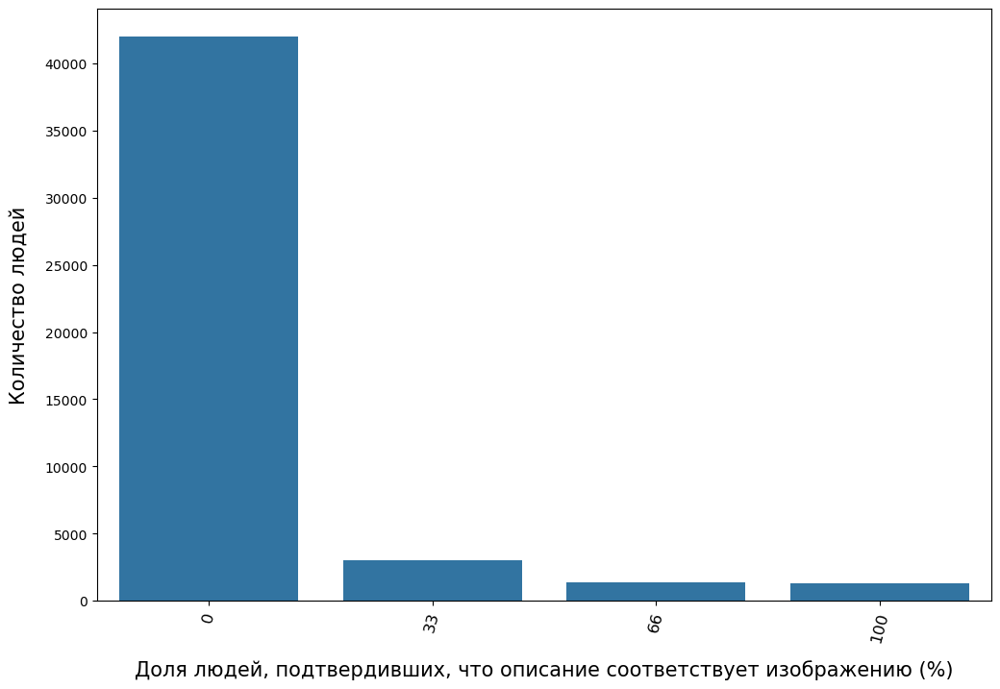

In [19]:
# Изображения и описания, полученные в результате работы краудсорсинга
crowd_per = df_crowd.copy()
crowd_per['share_pos'] *= 100
crowd_per['share_pos'] = crowd_per['share_pos'].astype('int')

y=[]
fraction_nums = np.array([0, 33, 66, 100])
for i in fraction_nums:
    y.append((crowd_per['share_pos'] == i).sum())
print(f"Колличество уникальных изображений: {df_crowd['image'].nunique()}")
plt.figure(figsize=(12, 8))
sns.barplot(x = fraction_nums, y = y)
plt.xticks(rotation=75, size=12)
plt.xlabel('Доля людей, подтвердивших, что описание соответствует изображению (%)', labelpad = 12, fontsize = 15)
plt.ylabel('Количество людей', labelpad = 12, fontsize = 15)
plt.show()


In [20]:
print("Уникальные картинки, которые есть в обоих наборах:", len(set(df_expert['image']) & set(df_crowd['image'])))

Уникальные картинки, которые есть в обоих наборах: 1000


In [21]:
# Объединим два датасета с описанией краудсорсинга и экспертов 
df_merged = df_expert.merge(df_crowd, on = ['image', 'query_id'], how='outer')
df_merged.head(10)

,image,query_id,avg_expert,share_pos,count_pos,count_neg
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,NaN,1.000000,3.0,0.0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,NaN,0.000000,0.0,3.0
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,NaN,0.000000,0.0,3.0
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,NaN,0.000000,0.0,3.0
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,NaN,0.000000,0.0,3.0
5,1056338697_4f7d7ce270.jpg,2204550058_2707d92338.jpg#2,NaN,0.000000,0.0,3.0
6,1056338697_4f7d7ce270.jpg,2224450291_4c133fabe8.jpg#2,NaN,0.000000,0.0,3.0
7,1056338697_4f7d7ce270.jpg,2248487950_c62d0c81a9.jpg#2,NaN,0.333333,1.0,2.0
8,1056338697_4f7d7ce270.jpg,2307118114_c258e3a47e.jpg#2,NaN,0.000000,0.0,3.0
9,1056338697_4f7d7ce270.jpg,2309860995_c2e2a0feeb.jpg#2,NaN,0.000000,0.0,3.0


In [22]:
# Доля пропущенных значений
df_merged.isna().mean() * 100

image          0.000000
query_id       0.000000
avg_expert    88.656158
share_pos      6.805915
count_pos      6.805915
count_neg      6.805915
dtype: float64

Пропущеные значения в count_pos и count_neg не возможно востановить

In [23]:
# Матрица корреляции avg_expert и share_pos
# Мы можем востановить пропущенные значения в столбце avg_expert 
display(df_merged[['avg_expert', 'share_pos']].corr())

,avg_expert,share_pos
avg_expert,1.000000,0.762474
share_pos,0.762474,1.000000


In [24]:
print('Подсчёт уникальных значений столбца share_pos')
print(df_merged.share_pos.value_counts())

Подсчёт уникальных значений столбца share_pos
share_pos
0.000000    41970
0.333333     3000
0.666667     1360
1.000000     1323
0.250000       96
0.500000       27
0.200000       22
0.750000        9
0.600000        8
0.400000        8
0.800000        4
0.166667        3
Name: count, dtype: int64


In [25]:
df_merged['avg_expert'].value_counts()

avg_expert
1.0    3327
2.0    1666
3.0     518
4.0     311
Name: count, dtype: int64

In [26]:
# Посмотрим среднюю долю людей и стандартное откланение для каждой уникальной оценки эксперта для дальнейшего заполнения пропусков
df_copy = df_merged.copy()
df_copy = df_copy.dropna()
unique_exp = df_expert.avg_expert.unique()

for i in unique_exp:
    print(f'Средняя доля людей, подтвердивших, что описание соответствует изображению',
          '{:.0%}'.format(df_copy.loc[df_copy['avg_expert'] == i, 'share_pos'].mean()),
          f'при оценке экспертов равной {i}:',
          ', std:',
          '{:.0%}'.format(df_copy.loc[df_copy['avg_expert'] == i, 'share_pos'].std()))

Средняя доля людей, подтвердивших, что описание соответствует изображению 0% при оценке экспертов равной 1: , std: 3%
Средняя доля людей, подтвердивших, что описание соответствует изображению 5% при оценке экспертов равной 2: , std: 14%
Средняя доля людей, подтвердивших, что описание соответствует изображению 31% при оценке экспертов равной 3: , std: 32%
Средняя доля людей, подтвердивших, что описание соответствует изображению 89% при оценке экспертов равной 4: , std: 20%


В результате работы с датасетом CrowdAnnotations.tsv, в котором содержатся данные по соответствию изображения и описания, полученные с помощью краудсорсинга, было установлено, что 87,75% всех изображений и запросов в датасете совершенно не соответствуют друг другу. И только 2,8% данных полностью соответствуют друг другу.

### Заполнение пропусков

#### Вариант 1

Наша модель должна возвращать на выходе вероятность соответствия изображения тексту и целевая переменная должна иметь значения от 0 до 1, поэтому было решено соединить два датасета, где за основу будет взят ExpertAnnotations.tsv, так как экпертные оценки имеют более высокое качество. Пропуски же было решено заполнить следующим образом. Если доля людей, подтвердивших, что описание соответствует изображению больше или равна 80% то присуждаем значение 4, от 60% до 80% - 3, от 30% до 60% - 2 и ниже - 1.

In [27]:
# Заполним пропуски для avg_expert
def agr_merge(row):
    if row['share_pos'] >= 0.8:
        return 4.0
    elif row['share_pos'] >= 0.5:
        return 3.0
    elif row['share_pos'] >= 0.3:
        return 2.0
    return 1.0

In [28]:
df_merged['predict'] = df_merged.progress_apply(agr_merge, axis=1)

100%|████████████████████████████████████████████████████████████████████████| 51323/51323 [00:00<00:00, 111427.81it/s]


In [29]:
df_copy = df_merged
df_copy = df_copy.dropna()
df_copy.sample(5)

,image,query_id,avg_expert,share_pos,count_pos,count_neg,predict
41030,3589367895_5d3729e3ea.jpg,3589367895_5d3729e3ea.jpg#2,4.0,1.000000,3.0,0.0,4.0
19263,2774554310_007e980a90.jpg,3442242092_e579538d82.jpg#2,1.0,0.000000,0.0,3.0,1.0
49249,542317719_ed4dd95dc2.jpg,542317719_ed4dd95dc2.jpg#2,4.0,0.666667,2.0,1.0,3.0
7084,2140182410_8e2a06fbda.jpg,2340206885_58754a799a.jpg#2,2.0,0.000000,0.0,3.0,1.0
18919,2748729903_3c7c920c4d.jpg,3591458156_f1a9a33918.jpg#2,1.0,0.000000,0.0,3.0,1.0


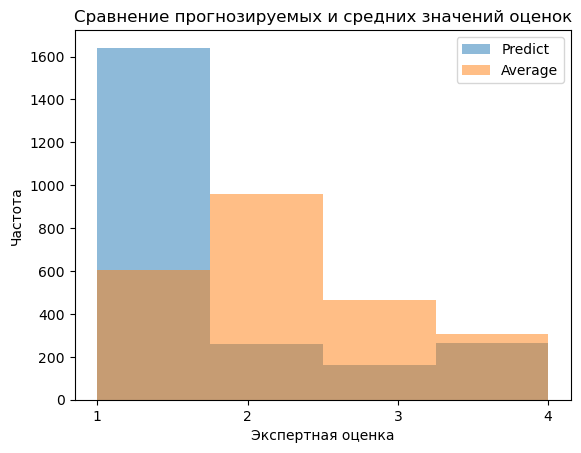

In [30]:
# Построение гистограмм
plt.hist(df_copy['predict'], bins=4, alpha=0.5, label='Predict')
plt.hist(df_copy['avg_expert'], bins=4, alpha=0.5, label='Average')
plt.xlabel('Экспертная оценка')
plt.xticks([1, 2, 3, 4])
plt.ylabel('Частота')
plt.title('Сравнение прогнозируемых и средних значений оценок')
plt.legend()
plt.show()

На данном графике отчётливо видно, что обе гистограммы имеют правостороннею асимметрию. Гистограмма pridict показывает, что большинство изображений и запросов в датасете совершенно не соответствуют друг другу и не совпадает в процентом соотношении с средней экспертной оценкой. Хотелось бы также отметить, что частота полного совпадения текста и картинки у обоих графиков примерно совпадает.  

In [31]:
# Рассчитаем параметр score 
def scoring(row):
    # Для тех значений share_pos, где не извесна оценка прировняем их к результату экспертов
    if np.isnan(row['avg_expert']):
        row['score'] = row['predict']
    else:
        row['score'] = row['avg_expert']
    return row

In [32]:
df_merged = df_merged.progress_apply(scoring, axis=1)
# Проверка корректности заполнения столбца score
df_merged.sample(5)

100%|██████████████████████████████████████████████████████████████████████████| 51323/51323 [00:20<00:00, 2516.89it/s]


,image,query_id,avg_expert,share_pos,count_pos,count_neg,predict,score
18328,2708686056_1b8f356264.jpg,2910758605_73a3f5a5c2.jpg#2,NaN,0.0,0.0,3.0,1.0,1.0
7710,219301555_17883a51bd.jpg,150387174_24825cf871.jpg#2,NaN,0.0,0.0,3.0,1.0,1.0
41217,3592968286_b63c81bcd2.jpg,3207358897_bfa61fa3c6.jpg#2,NaN,0.0,0.0,3.0,1.0,1.0
2026,1352410176_af6b139734.jpg,359837950_9e22ffe6c2.jpg#2,NaN,0.0,0.0,3.0,1.0,1.0
19786,2813992915_f732cf8539.jpg,3530843182_35af2c821c.jpg#2,NaN,0.0,0.0,3.0,1.0,1.0


In [33]:
# Преобразование столбца score в 0, 1
for i in range(df_merged.shape[0]):
    df_merged.iloc[i, df_merged.columns.get_loc('score')] = round((df_merged.iloc[i]['score'] - 1) / 3.0, 4)

In [34]:
df_merged.sample(10)

,image,query_id,avg_expert,share_pos,count_pos,count_neg,predict,score
40998,3589367895_5d3729e3ea.jpg,2196316998_3b2d63f01f.jpg#2,NaN,0.0,0.0,3.0,1.0,0.0000
10230,2333288869_8c01e4c859.jpg,2061354254_faa5bd294b.jpg#2,1.0,NaN,NaN,NaN,1.0,0.0000
42368,3630332976_fdba22c50b.jpg,2644430445_47c985a2ee.jpg#2,1.0,0.0,0.0,3.0,1.0,0.0000
2064,1356796100_b265479721.jpg,3741462565_cc35966b7a.jpg#2,NaN,0.0,0.0,3.0,1.0,0.0000
7550,2183227136_8bb657846b.jpg,2603792708_18a97bac97.jpg#2,2.0,NaN,NaN,NaN,1.0,0.3333
22149,2922973230_5a769ef92a.jpg,2854959952_3991a385ab.jpg#2,NaN,0.0,0.0,3.0,1.0,0.0000
44118,3716244806_97d5a1fb61.jpg,3251976937_20625dc2b8.jpg#2,NaN,0.0,0.0,3.0,1.0,0.0000
30777,324208502_674488bcea.jpg,3473264983_67917a931f.jpg#2,NaN,0.0,0.0,3.0,1.0,0.0000
39905,3549583146_3e8bb2f7e9.jpg,2885387575_9127ea10f1.jpg#2,NaN,0.0,0.0,3.0,1.0,0.0000
33557,3348385580_10b53391f9.jpg,1356796100_b265479721.jpg#2,NaN,0.0,0.0,3.0,1.0,0.0000


In [35]:
# Объеденим train и получившиеся массив
df_train_2 = pd.merge(df_train, df_merged[['image', 'query_id', 'score']], how='outer', on=['image', 'query_id'])
data_analysis(df_train_2)

Информация о датасете:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51323 entries, 0 to 51322
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       51323 non-null  object 
 1   query_id    51323 non-null  object 
 2   query_text  5822 non-null   object 
 3   score       51323 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.6+ MB
Первые 5 строк:


,image,query_id,query_text,score
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,NaN,1.0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,NaN,0.0
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,NaN,0.0
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,NaN,0.0
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,NaN,0.0


Описание данных:


,score
count,51323.000000
mean,0.078261
std,0.213096
min,0.000000
25%,0.000000
50%,0.000000
75%,0.000000
max,1.000000


Количество повторяющихся строк:


0

Процент пропущенных значений по столбцу:


image          0.00
query_id       0.00
query_text    88.66
score          0.00
dtype: float64

In [36]:
# Заполним все пропущенные значения на основе id
def fillna_train(row):
    if pd.isnull(row['query_text']):
        # Находим все строки с тем же query_id и не пустым query_text
        similar_rows = df_train_2[(df_train_2['query_id'] == row['query_id']) & df_train_2['query_text'].notnull()]
        if not similar_rows.empty:
            # Берем первое непустое значение query_text
            row['query_text'] = similar_rows.iloc[0]['query_text']
    return row

df_train_2 = df_train_2.progress_apply(fillna_train, axis=1)

100%|███████████████████████████████████████████████████████████████████████████| 51323/51323 [03:04<00:00, 278.15it/s]


In [37]:
df_train_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51323 entries, 0 to 51322
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       51323 non-null  object 
 1   query_id    51323 non-null  object 
 2   query_text  50214 non-null  object 
 3   score       51323 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.6+ MB


После заполнения пропусков в столбце query_text, у нас остались всё ещё пропущенные значения. Необходимо удалить их.

In [38]:
# Удалим NaN значения, к которым не нашлось похожего query_id
df_train_2.dropna(inplace=True)

In [39]:
# Проверка 
df_train_2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 50214 entries, 0 to 51322
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       50214 non-null  object 
 1   query_id    50214 non-null  object 
 2   query_text  50214 non-null  object 
 3   score       50214 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.9+ MB


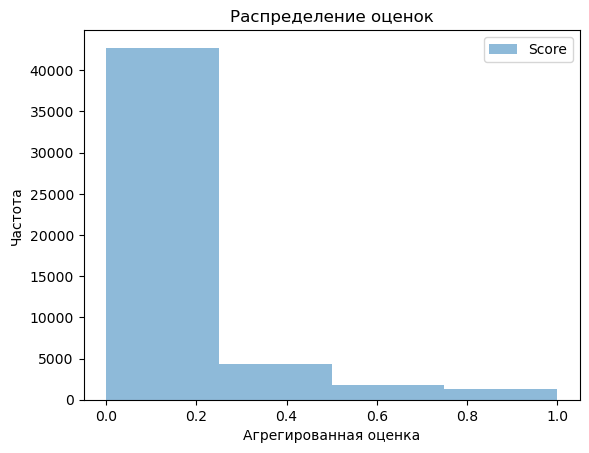

In [40]:
# Построение гистограмм
plt.hist(df_train_2['score'], bins=4, alpha=0.5, label='Score')
plt.xlabel('Агрегированная оценка')
plt.ylabel('Частота')
plt.title('Распределение оценок')
plt.legend()
plt.show()

In [41]:
print(f"Среднее значение столбца score - {round(df_train_2['score'].mean(), 4)}")

Среднее значение столбца score - 0.0792


#### Вывод
В ходе работы с данным датасетом было проведено несколько экспериментов, направленных на создание моделей машинного обучения и нейронных сетей, которые должны были возвращать вероятность соответствия изображения по заданному тексту. В процессе обучения модели были получены высокие показатели по метрикам MAE (средняя абсолютная ошибка) и RMSE (средняя квадратичная ошибка), со значениями ниже 0,15 в среднем. Это говорит о том, что модели теоретически могли бы хорошо предсказывать результаты.

Однако на практике модели не работали корректно. Например, на некоторых фотографиях не было ни одного изображения, похожего на текстовое описание. Кроме того, процент сходства, который показывали модели, был очень низким, менее 0,18. Это указывает на то, что модели часто не могли найти соответствия между изображением и текстом.

Основная причина такого поведения моделируется в характеристиках самого датасета. Хотя датасет и содержит большое количество данных, более 80% из них представляют собой фотографии, к которым не подходит текстовое описание. Это говорит о том, что выборка сильно несбалансирована. Среднее значение столбца score составляет всего 0,0792, что подтверждает низкий процент совпадений на тестовых данных.

Таким образом, основная проблема заключается в качестве и сбалансированности датасета. Для достижения более точных и корректных результатов необходимо улучшить датасет, обеспечивающий большее соответствие между изображениями и текстовыми описаниями. 

#### Вариант 2

In [42]:
# Объеденим train и получившиеся массив
df_train = pd.merge(df_train, df_expert[['image', 'query_id', 'avg_expert']], how='outer', on=['image', 'query_id'])
data_analysis(df_train)

Информация о датасете:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
 3   avg_expert  5822 non-null   int64 
dtypes: int64(1), object(3)
memory usage: 182.1+ KB
Первые 5 строк:


,image,query_id,query_text,avg_expert
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...,1
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,1
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,A woman plays with long red ribbons in an empt...,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .,1


Описание данных:


,avg_expert
count,5822.000000
mean,1.624356
std,0.856222
min,1.000000
25%,1.000000
50%,1.000000
75%,2.000000
max,4.000000


Количество повторяющихся строк:


0

Процент пропущенных значений по столбцу:


image         0.0
query_id      0.0
query_text    0.0
avg_expert    0.0
dtype: float64

In [43]:
# Преобразование столбца score в 0, 1
for i in range(df_train.shape[0]):
    df_train.iloc[i, df_train.columns.get_loc('avg_expert')] = round((df_train.iloc[i]['avg_expert'] - 1) / 3.0, 4)

C:\Users\VMP.PC\AppData\Local\Temp\ipykernel_7372\454340819.py:3: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.3333' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_train.iloc[i, df_train.columns.get_loc('avg_expert')] = round((df_train.iloc[i]['avg_expert'] - 1) / 3.0, 4)


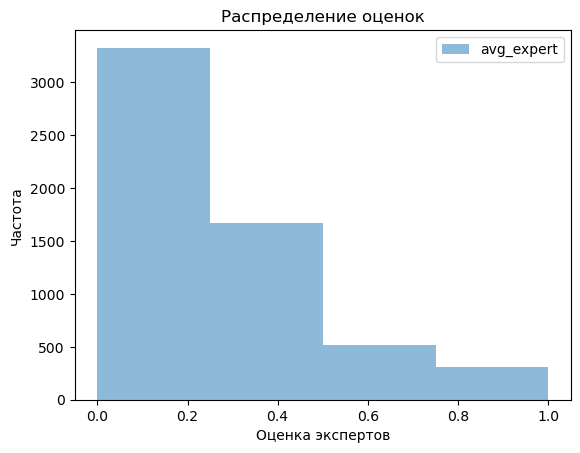

In [44]:
# Построение гистограмм
plt.hist(df_train['avg_expert'], bins=4, alpha=0.5, label='avg_expert')
plt.xlabel('Оценка экспертов')
plt.ylabel('Частота')
plt.title('Распределение оценок')
plt.legend()
plt.show()

In [45]:
print(f"Среднее значение столбца avg_expert - {round(df_train['avg_expert'].mean(), 4)}")

Среднее значение столбца avg_expert - 0.2081


#### Вывод
Данная выборка продемонстрировала лучшие результаты на этапе тестирования модели. Датасет содержит только мнение экспертов и является более сбалансированным по сравнению с предыдущим. Несмотря на то что график распределения по-прежнему демонстрирует правостороннюю асимметрию, 57% всех изображений и запросов в датасете совершенно не соответствуют друг другу.

Среднее значение столбца score в новом датасете составило 0,2081. Это свидетельствует о более высоком проценте совпадений между изображениями и текстовыми описаниями. Модель, обученная на этом датасете, уже способна находить значительное количество похожих картинок, а процент схожести по тестовому описанию варьируется примерно от 0,3 до 0,5.

Таким образом, использование данного датасета позволило улучшить результаты на этапе тестирования, что указывает на важность наличия сбалансированных и качественно аннотированных данных для построения эффективных моделей машинного обучения и нейронных сетей.

### Вывод
В рамках данного раздела были изучены датасеты ExpertAnnotations.tsv и CrowdAnnotations.tsv, где за основу был взят датасет - ExpertAnnotations.tsv.

## Проверка данных

В некоторых странах, где работает ваша компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
>

Однако у вас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

In [46]:
lemmatize = nltk.WordNetLemmatizer()

# очищаем текст
def get_lemmas(text) -> list:
    text = re.sub('[^a-zA-Z]', ' ', text).lower() 
    text = nltk.word_tokenize(text, language = 'english') 
    text = [lemmatize.lemmatize(word) for word in text] 
    return text

# Отмечаем тексты, которые необходимо заблокировать
def cleaning(row) -> object:
    text = get_lemmas(row['query_text'])
    if [i for i in text if i in WORD_TO_BLOCK]:
        row['to_block'] = 1
    else:
        row['to_block'] = 0
    return row

In [47]:
%time df_train = df_train.apply(cleaning, axis=1)

CPU times: total: 3.86 s
Wall time: 3.86 s


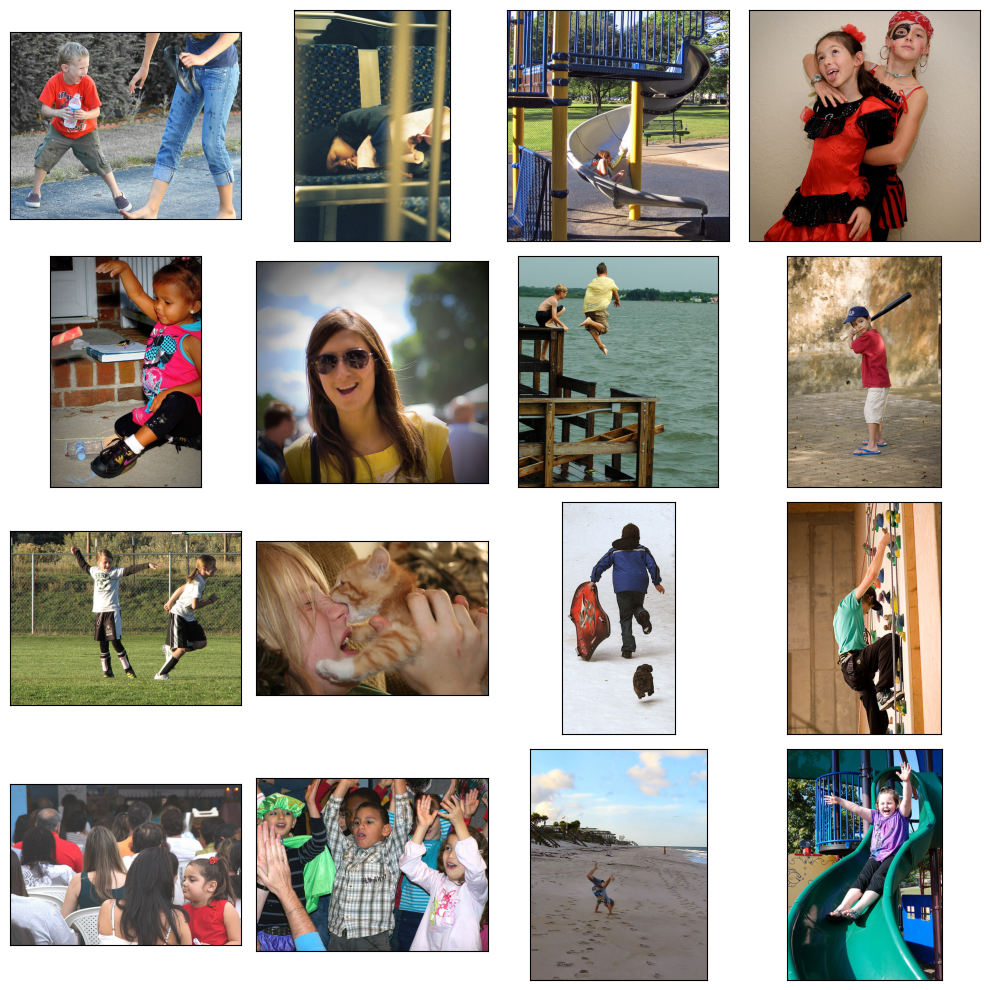

In [48]:
# Проверка корректной работы функции
block_pictures = list(df_train[df_train['to_block'] == 1]['query_id'].sample(16))

fig = plt.figure(figsize=(10,10))
for i in range(16):
    fig.add_subplot(4, 4, i+1)
    image = Image.open(Path(PATH, 'train_images', block_pictures[i][:-2]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

Функция работает коректно, однако мы можем увидеть, что некоторые картинки не соотвествуют описанию. Было установлено, что query_id содержит в себе название картинок к которым подходит данное описание. В следствие чего было решено получить список всех картинок содержащих описание детей и исключить их из тренировочного датасета. В разделе Исследовательский анализ данных было установлено, что количество уникальных картинок не соотвествует количеству уникальных текстовых описаний, поэтому было решено пересмотреть и исключить фотографии с детьми в этой части в ручную.

In [49]:
# Создаём лист с картинками, к которым существует точное описание (аналагичное по названию query_id)
list_un_query = list(df_train['query_id'].str.replace('#2', ''))
# Исключаем данный список из датасета
df_pictures = df_train[~df_train['image'].isin(list_un_query)]

In [50]:
print(f'Количество картинок, у которых нет собственного описания - {df_pictures['image'].nunique()}')

Количество картинок, у которых нет собственного описания - 23


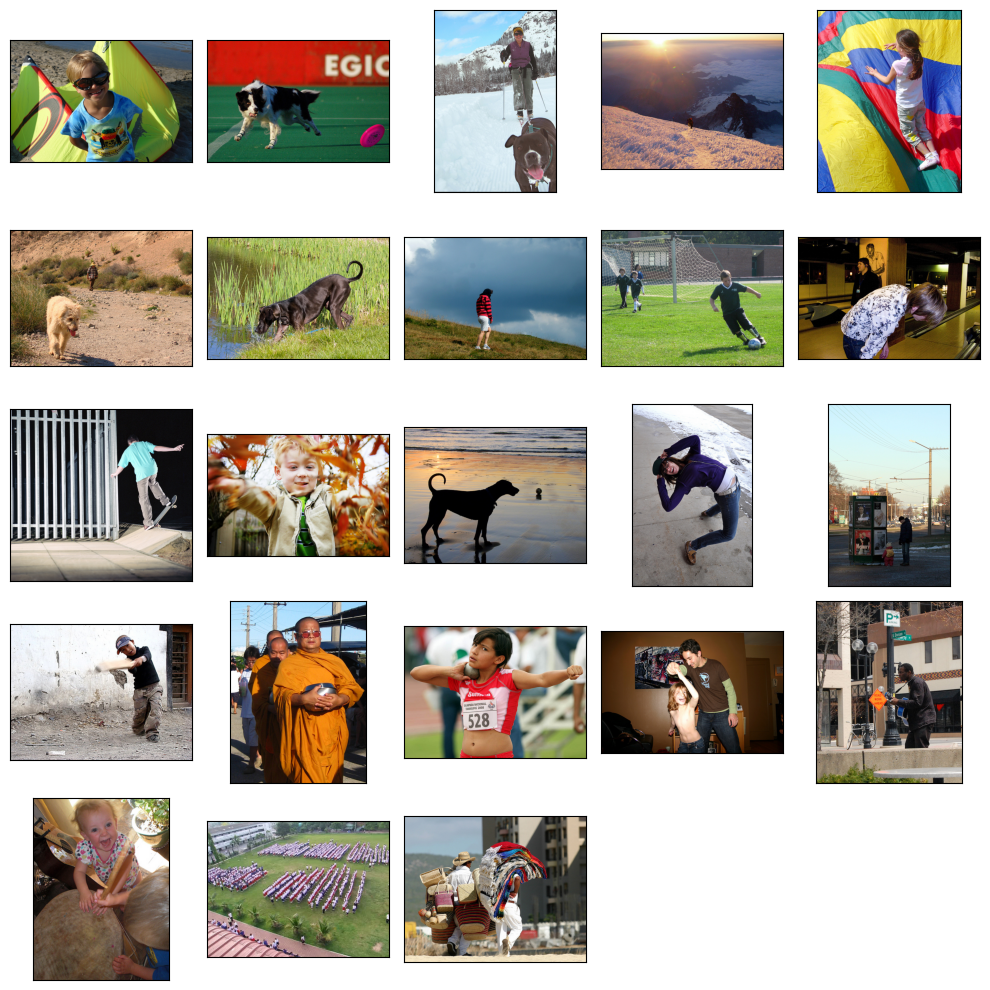

In [51]:
df_without_query = list(df_pictures['image'].unique())

fig = plt.figure(figsize=(10,10))
for i in range(23):
    fig.add_subplot(5, 5, i+1)
    image = Image.open(Path(PATH, 'train_images', df_without_query[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

In [52]:
df_without_query

['1343426964_cde3fb54e8.jpg',
 '2054869561_ff723e9eab.jpg',
 '2194494220_bb2178832c.jpg',
 '223299142_521aedf9e7.jpg',
 '2431832075_00aa1a4457.jpg',
 '2479162876_a5ce3306af.jpg',
 '2482629385_f370b290d1.jpg',
 '2806710650_e201acd913.jpg',
 '2913965136_2d00136697.jpg',
 '3015863181_92ff43f4d8.jpg',
 '3019842612_8501c1791e.jpg',
 '3116769029_f5a76f04ba.jpg',
 '3149919755_f9272b10b3.jpg',
 '3185371756_ff4e9fa8a6.jpg',
 '3203453897_6317aac6ff.jpg',
 '3349451628_4249a21c8f.jpg',
 '3375549004_beee810e60.jpg',
 '3387542157_81bfd00072.jpg',
 '3427118504_93126c83e0.jpg',
 '3499720588_c32590108e.jpg',
 '3521374954_37371b49a4.jpg',
 '3523559027_a65619a34b.jpg',
 '86412576_c53392ef80.jpg']

В ручную было установлено, что на данных картинках изображены дети, поэтому их необходимо будет удалить из датасета - 1343426964_cde3fb54e8.jpg, 2431832075_00aa1a4457.jpg, 2913965136_2d00136697.jpg, 3116769029_f5a76f04ba.jpg, 3203453897_6317aac6ff.jpg, 3349451628_4249a21c8f.jpg, 3427118504_93126c83e0.jpg ,3521374954_37371b49a4.jpg

Далее необходимо список плохих изображений, у которых в описании присутствуют слова из нашего стоп листа (WORD_TO_BLOCK) и в дальнейшем исключить их

In [53]:
# Получаем список с image, где присутствуют дети
df_chilren_pictures = list(df_train['query_id'].loc[df_train['to_block'] == 1].str.replace('#2', ''))

In [54]:
# Удаляем из столбца image все картинки, где присутствуют дети
df_train = df_train[~df_train['image'].isin(df_chilren_pictures)]

In [55]:
# Проверка остались ли картинки с детьми в датасете на примере 2549968784_39bfbe44f9.jpg
df_train.loc[df_train['image'] == '2549968784_39bfbe44f9.jpg']

,image,query_id,query_text,avg_expert,to_block


In [56]:
# Создаём лист с фотографиями детей
list_child = [
    "1343426964_cde3fb54e8.jpg",
    "2431832075_00aa1a4457.jpg",
    "2913965136_2d00136697.jpg",
    "3116769029_f5a76f04ba.jpg",
    "3203453897_6317aac6ff.jpg",
    "3349451628_4249a21c8f.jpg",
    "3427118504_93126c83e0.jpg",
    "3521374954_37371b49a4.jpg"
]

# Удаляем из столбца image, которые мы обнаружили в ручную
df_train = df_train[~df_train['image'].isin(list_child)]

In [57]:
# Проверка остались ли картинки с детьми в датасете на примере 1343426964_cde3fb54e8.jpg
df_train.loc[df_train['image'] == '1343426964_cde3fb54e8.jpg']

,image,query_id,query_text,avg_expert,to_block


In [58]:
df_train.drop(columns=['to_block'], inplace=True)
df_train = df_train.reset_index(drop=True)
df_train.head()

,image,query_id,query_text,avg_expert
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...,0.0000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.0000
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,A woman plays with long red ribbons in an empt...,0.3333
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .,0.0000


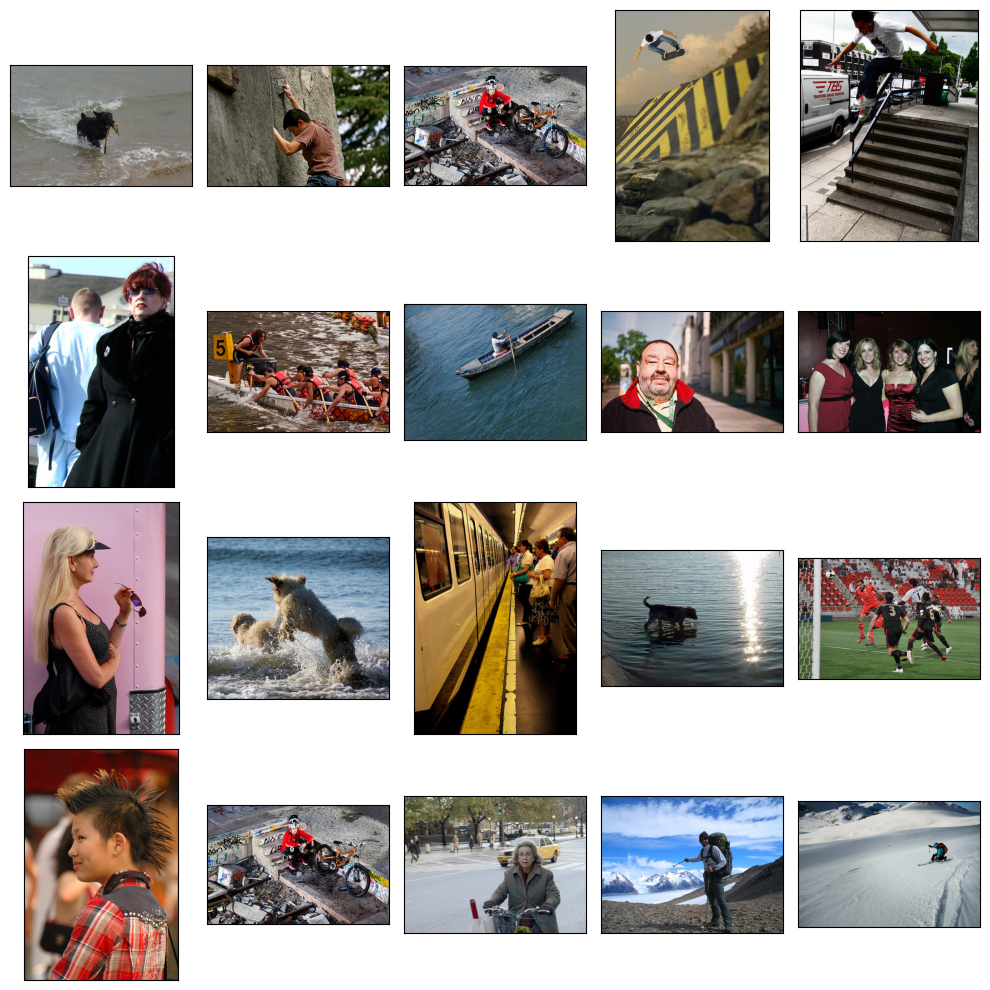

In [59]:
df_without_children = list(df_train['image'].sample(20))

fig = plt.figure(figsize=(10,10))
for i in range(20):
    fig.add_subplot(4, 5, i+1)
    image = Image.open(Path(PATH, 'train_images', df_without_children[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

In [60]:
print(f'Количество уникальных фотографий в датасете - {df_train.image.nunique()}')

Количество уникальных фотографий в датасете - 707


### Вывод
На текущем этапе работы мы удалили все фотографии, на которых изображены дети. После выполнения этой задачи в нашем датасете осталось 707 уникальных изображений. Процесс удаления фотографий с детьми осуществлялся двумя методами.

Первый метод заключался в автоматической фильтрации: мы находили все изображения, названия которых совпадали с query_id, содержащими такие слова, как girl, boy, kid, teenage, baby, child, teenager, children, young boy, young girl, и удаляли соответствующие фотографии.

Для оставшихся 23 изображений была проведена ручная оценка. Таким образом, мы обеспечили полное удаление всех фотографий с детьми из нашего набора да.оды.

## Векторизация изображений

Перейдём к векторизации изображений.

Самый примитивный способ — прочесть изображение и превратить полученную матрицу в вектор. Такой способ нам не подходит: длина векторов может быть сильно разной, так как размеры изображений разные. Поэтому стоит обратиться к свёрточным сетям: они позволяют "выделить" главные компоненты изображений. Как это сделать? Нужно выбрать какую-либо архитектуру, например ResNet-18, посмотреть на слои и исключить полносвязные слои, которые отвечают за конечное предсказание. При этом можно загрузить модель данной архитектуры, предварительно натренированную на датасете ImageNet.

In [61]:
def load_train(path=PATH):    
    train_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
    train_gen_flow = train_datagen.flow_from_dataframe(
        dataframe=df_train,
        directory=Path(path, 'train_images'),
        x_col='image',
        y_col='score',
        target_size=(224, 224),
        batch_size=16,
        class_mode='input',
        seed=RS,
        shuffle=False)
    return train_gen_flow

Found 4065 validated image filenames.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

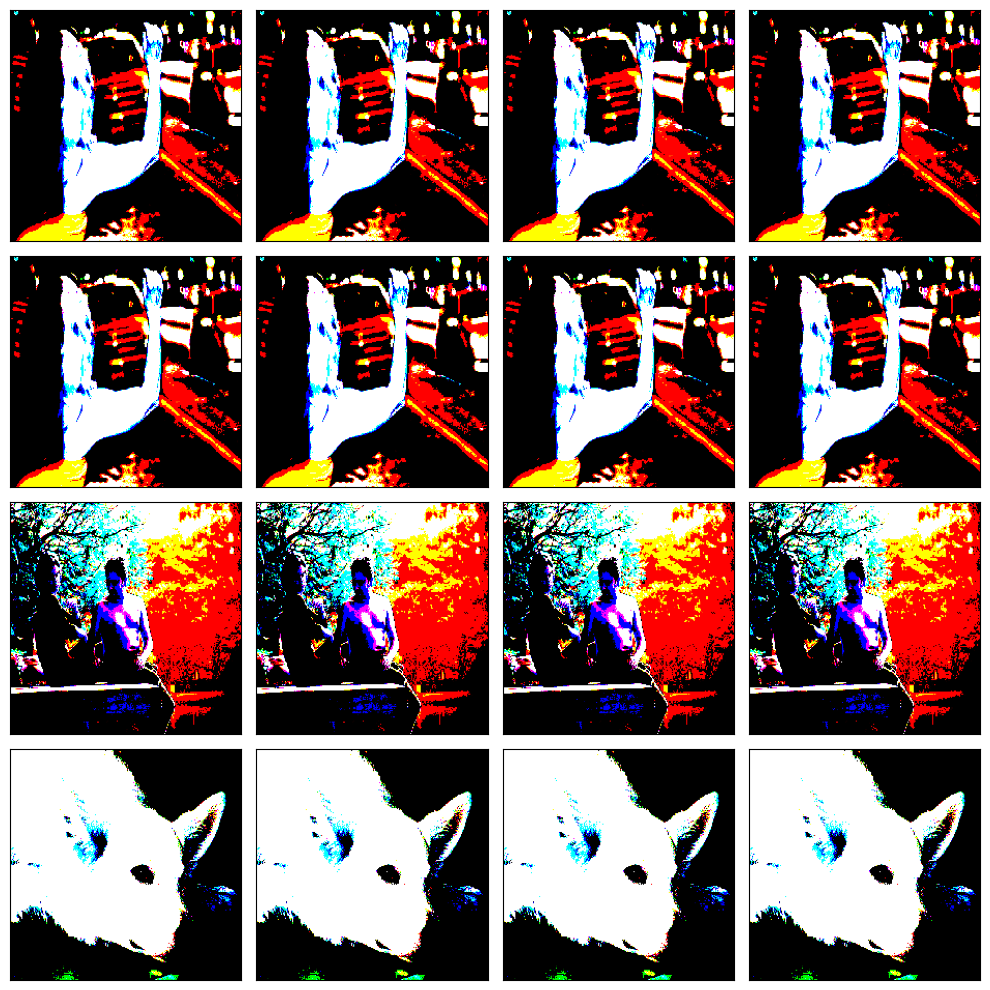

In [62]:
features, target = next(load_train())

fig = plt.figure(figsize=(10,10))
for i in range(16):
    fig.add_subplot(4, 4, i+1)
    plt.imshow(features[i])
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
plt.show()

In [63]:
df_train.head(10)

,image,query_id,query_text,avg_expert
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.0000
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...,0.0000
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.0000
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,A woman plays with long red ribbons in an empt...,0.3333
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .,0.0000
5,1056338697_4f7d7ce270.jpg,3360930596_1e75164ce6.jpg#2,A soccer ball is above the head of a man weari...,0.0000
6,1056338697_4f7d7ce270.jpg,3545652636_0746537307.jpg#2,A young boy dressed in a red uniform kicks the...,0.0000
7,1056338697_4f7d7ce270.jpg,434792818_56375e203f.jpg#2,A man and woman look back at the camera while ...,0.0000
8,1082379191_ec1e53f996.jpg,1287475186_2dee85f1a5.jpg#2,A young boy in a swimming suit sits in water .,0.0000
9,1082379191_ec1e53f996.jpg,1536774449_e16b1b6382.jpg#2,A crowd of people at an outdoor event,0.3333


Полученные изображения идут в том же порядке как в датафрейме, поэтому первые 8 изображений у нас получились одинаковыми.

In [64]:
# Создадим свёрточную нейросеть
#def nn_picture_model():
#    ResNet18, preprocess_input = Classifiers.get('resnet18')
#    backbone = ResNet18(input_shape=(224,224,3),
#                        include_top=False,
#                        weights='imagenet')

#    model = Sequential()
#    model.add(backbone)
 #   model.add(GlobalAveragePooling2D())
#    optimizer = Adam(learning_rate=1e-3)
#    model.compile(loss='mean_squared_error', optimizer=optimizer, metrics=['mean_absolute_error'])
#    return model

In [65]:
# Создадим свёрточную нейросеть
def nn_picture_model():
    backbone = ResNet50(input_shape=(224,224,3),
                        include_top=False,
                        weights='imagenet')

    model = Sequential()
    model.add(backbone)
    model.add(GlobalAveragePooling2D())
    optimizer = Adam(learning_rate=1e-4)
    model.compile(loss='mean_squared_error', optimizer=optimizer, metrics=['mean_absolute_error'])
    return model

In [66]:
def image_vectorization(model, df_train):
    predictions = model.predict(df_train)
    return predictions

In [67]:
%%time
vector_pictures = image_vectorization(nn_picture_model(), load_train())
vector_pictures.shape

Found 4065 validated image filenames.


C:\Users\VMP.PC\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


255/255 ━━━━━━━━━━━━━━━━━━━━ 128s 495ms/step
CPU times: total: 21min 24s
Wall time: 2min 9s


(4065, 2048)

### Вывод
Проведена успешная векторизация картинок с помощью применения нейросети ResNet50

## Векторизация текстов

Следующий этап — векторизация текстов. Вы можете поэкспериментировать с несколькими способами векторизации текстов:

- tf-idf
- word2vec
- \*трансформеры (например Bert)

\* — если вы изучали трансформеры в спринте Машинное обучение для текстов.


In [68]:
# POS-тег 
def get_wordnet_pos(word: str) -> str:
    tag = nltk.pos_tag([word])[0][1][0].upper()
    tag_dict = {"J": wordnet.ADJ,
                "N": wordnet.NOUN,
                "V": wordnet.VERB,
                "R": wordnet.ADV}
    
    return tag_dict.get(tag, wordnet.NOUN)

In [69]:
lemmatizer = WordNetLemmatizer()

def lemmatize_text(text):
    text = text.lower()
    words = nltk.word_tokenize(text)
    lemm_words = [lemmatizer.lemmatize(word, get_wordnet_pos(word)) for word in words]
    lemm_text = " ".join(lemm_words)
    cleared_text = re.sub(r'[^a-zA-Z\s]', '', lemm_text) 
    return cleared_text

In [70]:
df_train['lemm_text'] = df_train['query_text'].progress_apply(lemmatize_text)
print(df_train['lemm_text'].head(3))

100%|█████████████████████████████████████████████████████████████████████████████| 4065/4065 [00:17<00:00, 237.41it/s]

0    a young child be wear blue goggles and sit in ...
1       a girl wear a yellow shirt and sunglass smile 
2        a man sleep under a blanket on a city street 
Name: lemm_text, dtype: object


In [71]:
# Использование TF-IDF для получения эмбеддингов
stop_words = list(stopwords.words('english'))
vectorizer = TfidfVectorizer(stop_words=stop_words)

In [72]:
vectorizer.fit(df_train['lemm_text'])

TfidfVectorizer(stop_words=['i', 'me', 'my', 'myself', 'we', 'our', 'ours',
                            'ourselves', 'you', "you're", "you've", "you'll",
                            "you'd", 'your', 'yours', 'yourself', 'yourselves',
                            'he', 'him', 'his', 'himself', 'she', "she's",
                            'her', 'hers', 'herself', 'it', "it's", 'its',
                            'itself', ...])

In [73]:
tfidf_embeddings = np.array(vectorizer.transform(df_train['lemm_text']).todense().tolist())

In [74]:
list(set(tfidf_embeddings[0]))[:5]

[0.0,
 0.28425874831532527,
 0.5132236220073938,
 0.29056721824101944,
 0.4455265530244806]

In [75]:
tfidf_embeddings.shape

(4065, 1149)

### Вывод
Проведена успешная векторизация текста с помощью TF-IDF

## Объединение векторов

Подготовьте данные для обучения: объедините векторы изображений и векторы текстов с целевой переменной.

In [76]:
features = np.concatenate((vector_pictures, tfidf_embeddings), axis=1)
features.shape

(4065, 3197)

In [77]:
target = np.array(df_train['avg_expert'])
target.shape

(4065,)

## Обучение модели предсказания соответствия

Для обучения разделите датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в тестовую выборки.
Для того чтобы учесть изображения при разбиении, можно воспользоваться классом [GroupShuffleSplit](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GroupShuffleSplit.html) из библиотеки sklearn.model_selection.

Код ниже разбивает датасет на тренировочную и тестовую выборки в пропорции 7:3 так, что строки с одинаковым значением 'group_column' будут содержаться либо в тестовом, либо в тренировочном датасете.

```
from sklearn.model_selection import GroupShuffleSplit
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, test_indices = next(gss.split(X=df.drop(columns=['target']), y=df['target'], groups=df['group_column']))
train_df, test_df = df.loc[train_indices], df.loc[test_indices]

```

Какую модель использовать — выберите самостоятельно. Также вам предстоит выбрать метрику качества либо реализовать свою.

In [78]:
# Разделение на train и test
gss = GroupShuffleSplit(n_splits=1, train_size=.8, random_state=RS)
train_indices, test_indices = next(gss.split(X=features, y=target, groups=df_train['image']))
# features
features_train, features_valid = features[train_indices], features[test_indices]
# target
target_train, target_valid = target[train_indices], target[test_indices]

In [79]:
# Проведём нормализацию
scaler = StandardScaler()
scaler.fit(features_train)
features_train = scaler.transform(features_train)
features_valid= scaler.transform(features_valid)

In [80]:
print(f'Размер тренировочной выборки:')
display(features_train.shape)
display(target_train.shape)

print(f'Размер валидационной выборки:')
display(features_valid.shape)
display(target_valid.shape)

Размер тренировочной выборки:


(3245, 3197)

(3245,)

Размер валидационной выборки:


(820, 3197)

(820,)

### LinearRegression

In [81]:
model_lr = LinearRegression(n_jobs = -1)

In [82]:
%%time
model_lr.fit(features_train, target_train)

CPU times: total: 35.3 s
Wall time: 6.68 s


LinearRegression(n_jobs=-1)

In [83]:
predict_lr = model_lr.predict(features_valid)
mae_lr = mean_absolute_error(target_valid, predict_lr)
rmse_lr = mean_squared_error(target_valid, predict_lr) ** 0.5

In [84]:
model_characteristics = {
    'LinearRegression': {
        'MAE': mae_lr,
        'RMSE': rmse_lr
    },
}
info = pd.DataFrame(model_characteristics).T
info

,MAE,RMSE
LinearRegression,2.122264e+12,2.569498e+12


### Ridge

In [85]:
model_R = Ridge()

In [86]:
%%time
model_R.fit(features_train, target_train)

CPU times: total: 1.89 s
Wall time: 575 ms


Ridge()

In [87]:
predict_Ridge = model_R.predict(features_valid)
mae_r = round(mean_absolute_error(target_valid, predict_Ridge), 4)
rmse_r = round((mean_squared_error(target_valid, predict_Ridge)) ** 0.5, 4)

In [88]:
model_characteristics['Ridge'] = {
        'MAE': mae_r,
        'RMSE': rmse_r
}

info = pd.DataFrame(model_characteristics).T
info

,MAE,RMSE
LinearRegression,2.122264e+12,2.569498e+12
Ridge,2.722000e-01,3.477000e-01


### LinearSVR

In [89]:
model_LSVR = LinearSVR(loss = 'squared_epsilon_insensitive', C = 1, random_state=RS)

In [90]:
%%time
model_LSVR.fit(features_train, target_train)

C:\Users\VMP.PC\anaconda3\Lib\site-packages\sklearn\svm\_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(


CPU times: total: 19.5 s
Wall time: 19.5 s


C:\Users\VMP.PC\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1237: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


LinearSVR(C=1, loss='squared_epsilon_insensitive', random_state=42)

In [91]:
predict_LSVR = model_LSVR.predict(features_valid)
mae_LSVR = round(mean_absolute_error(target_valid, predict_LSVR), 4)
rmse_LSVR = round((mean_squared_error(target_valid, predict_LSVR)) ** 0.5, 4)

In [92]:
model_characteristics['LinearSVR'] = {
        'MAE': mae_LSVR,
        'RMSE': rmse_LSVR
}

info = pd.DataFrame(model_characteristics).T
info

,MAE,RMSE
LinearRegression,2.122264e+12,2.569498e+12
Ridge,2.722000e-01,3.477000e-01
LinearSVR,2.995000e-01,3.829000e-01


### DecisionTreeRegressor

In [93]:
pipe_dt = make_pipeline(
    DecisionTreeRegressor()
)

parameters = {
    'decisiontreeregressor__max_depth':np.arange(1, 20),
    'decisiontreeregressor__splitter' : ['best', 'random']
}

gs_rt = GridSearchCV(
    pipe_dt,
    parameters,
    scoring='neg_root_mean_squared_error',
    n_jobs = -1,
    verbose = 1,
    cv = 3
)

In [94]:
%%time
gs_rt.fit(features_train, target_train)

Fitting 3 folds for each of 38 candidates, totalling 114 fits
CPU times: total: 1.56 s
Wall time: 27.9 s


GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('decisiontreeregressor',
                                        DecisionTreeRegressor())]),
             n_jobs=-1,
             param_grid={'decisiontreeregressor__max_depth': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19]),
                         'decisiontreeregressor__splitter': ['best', 'random']},
             scoring='neg_root_mean_squared_error', verbose=1)

In [95]:
predict_rt = gs_rt.predict(features_valid)
mae_rt = round(mean_absolute_error(target_valid, predict_rt), 4)
rmse_rt = round((mean_squared_error(target_valid, predict_rt)) ** 0.5, 4)

In [96]:
model_characteristics['DecisionTreeRegressor'] = {
        'MAE': mae_rt,
        'RMSE': rmse_rt
}

info = pd.DataFrame(model_characteristics).T
info

,MAE,RMSE
LinearRegression,2.122264e+12,2.569498e+12
Ridge,2.722000e-01,3.477000e-01
LinearSVR,2.995000e-01,3.829000e-01
DecisionTreeRegressor,2.280000e-01,2.832000e-01


### LGBMRegressor

In [97]:
pipe_LGBM = make_pipeline(
    LGBMRegressor()
)

param_grid = {
    'lgbmregressor__metric': ['l2'],
    'lgbmregressor__max_depth':np.arange(1, 10),
    'lgbmregressor__n_estimators':np.arange(100, 1000, 100),
    'lgbmregressor__boosting_type': ['gbdt'],
    'lgbmregressor__num_leaves': [128],
    'lgbmregressor__random_state' : [RS],
}

model_LGBM = GridSearchCV(
    pipe_LGBM,
    param_grid,
    cv = 3,
    scoring='neg_root_mean_squared_error',
    n_jobs=-1,
    verbose=1
)

In [98]:
%%time
model_LGBM.fit(features_train, target_train)

Fitting 3 folds for each of 81 candidates, totalling 243 fits
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.052496 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 520663
[LightGBM] [Info] Number of data points in the train set: 3245, number of used features: 2245
[LightGBM] [Info] Start training from score 0.233173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain

GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('lgbmregressor', LGBMRegressor())]),
             n_jobs=-1,
             param_grid={'lgbmregressor__boosting_type': ['gbdt'],
                         'lgbmregressor__max_depth': array([1, 2, 3, 4, 5, 6, 7, 8, 9]),
                         'lgbmregressor__metric': ['l2'],
                         'lgbmregressor__n_estimators': array([100, 200, 300, 400, 500, 600, 700, 800, 900]),
                         'lgbmregressor__num_leaves': [128],
                         'lgbmregressor__random_state': [42]},
             scoring='neg_root_mean_squared_error', verbose=1)

In [99]:
predict_LGBM = model_LGBM.predict(features_valid)
mae_LGBM = round(mean_absolute_error(target_valid, predict_LGBM), 4)
rmse_LGBM = round((mean_squared_error(target_valid, predict_LGBM)) ** 0.5, 4)

In [100]:
model_characteristics['LGBMRegressor'] = {
        'MAE': mae_LGBM ,
        'RMSE': rmse_LGBM 
}

info = pd.DataFrame(model_characteristics).T
info

,MAE,RMSE
LinearRegression,2.122264e+12,2.569498e+12
Ridge,2.722000e-01,3.477000e-01
LinearSVR,2.995000e-01,3.829000e-01
DecisionTreeRegressor,2.280000e-01,2.832000e-01
LGBMRegressor,1.967000e-01,2.601000e-01



На данном этапе работы модель LGBMRegressor продемонстрировала наилучшие результаты по следующим метрикам: средняя абсолютная ошибка (MAE) составила 0,1998 , а корень средней квадратической ошибки (RSME) равен 0,26 .

В дальнейшем мы будем использовать эти показатели в качестве эталона для оценки эффективности модели. Все последующие результаты, полученные с использованием нейросетевых методов, будут сравниваться с этими значениями, чтобы определить, насколько успешны наши улучшения.

### NeuralNetwork

In [101]:
features_train.shape

(3245, 3197)

In [102]:
def nn_model(input_shape, n_in_neurons, n_hidden_neurons_1, n_hidden_neurons_2, n_hidden_neurons_3,  n_hidden_neurons_4, n_out_neurons):

    model = Sequential()
    model.add(Dense(n_in_neurons, input_shape = input_shape, activation='tanh'))
#    model.add(BatchNormalization())
    model.add(Dropout(rate = 0.3))
    model.add(Dense(n_hidden_neurons_1, activation='tanh'))
#    model.add(Dropout(rate = 0.3))
    model.add(BatchNormalization())
    model.add(Dense(n_hidden_neurons_2, activation='silu'))
    model.add(Dropout(rate = 0.5))
#    model.add(BatchNormalization())
    model.add(Dense(n_hidden_neurons_3, activation='elu'))
    model.add(BatchNormalization())
    model.add(Dense(n_hidden_neurons_4, activation='silu'))
    model.add(Flatten())
    model.add(Dense(n_out_neurons, activation='linear'))

    optimizer = Adam(learning_rate=1e-4)
    model.compile(loss='mean_squared_error', optimizer=optimizer, metrics=['mae'])

    return model

In [103]:
n_in_neurons = features_train.shape[1]
input_shape=(n_in_neurons,)
n_hidden_neurons_1 = 1024
n_hidden_neurons_2 = 512
n_hidden_neurons_3 = 256
n_hidden_neurons_4 = 128
n_out_neurons = 1

In [104]:
def train_model(model, features_train, target_train, features_valid, target_valid, batch_size=32, epochs=10,
                steps_per_epoch=None, validation_steps=None):
    
    early_stopping = EarlyStopping(monitor='val_loss', patience=100, restore_best_weights=True)
    
    model.fit(features_train,
                        target_train,
                        validation_data=(features_valid, target_valid),
                        batch_size=batch_size,
                        epochs=epochs,
                        steps_per_epoch=steps_per_epoch,
                        validation_steps=validation_steps,
                        verbose=2,
                        shuffle=True,
                        callbacks=[early_stopping])
    
#    best_mae = np.min(history.history['val_loss']) 
#    best_predicted = model.predict(features_valid)
    
    return model

In [105]:
model = nn_model(input_shape, n_in_neurons, n_hidden_neurons_1, n_hidden_neurons_2, n_hidden_neurons_3,  n_hidden_neurons_4, n_out_neurons)

C:\Users\VMP.PC\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [106]:
history = train_model(model, features_train, target_train, features_valid, target_valid, batch_size=32, epochs=300,
                                             steps_per_epoch=None, validation_steps=None)

Epoch 1/300
102/102 - 13s - 124ms/step - loss: 0.6317 - mae: 0.6191 - val_loss: 0.1367 - val_mae: 0.2848
Epoch 2/300
102/102 - 9s - 91ms/step - loss: 0.3480 - mae: 0.4705 - val_loss: 0.1261 - val_mae: 0.2819
Epoch 3/300
102/102 - 9s - 91ms/step - loss: 0.2483 - mae: 0.3967 - val_loss: 0.1292 - val_mae: 0.2810
Epoch 4/300
102/102 - 9s - 91ms/step - loss: 0.2210 - mae: 0.3697 - val_loss: 0.1113 - val_mae: 0.2640
Epoch 5/300
102/102 - 9s - 91ms/step - loss: 0.1857 - mae: 0.3413 - val_loss: 0.1075 - val_mae: 0.2576
Epoch 6/300
102/102 - 9s - 91ms/step - loss: 0.1699 - mae: 0.3231 - val_loss: 0.1060 - val_mae: 0.2543
Epoch 7/300
102/102 - 10s - 94ms/step - loss: 0.1449 - mae: 0.3009 - val_loss: 0.1001 - val_mae: 0.2418
Epoch 8/300
102/102 - 9s - 92ms/step - loss: 0.1347 - mae: 0.2870 - val_loss: 0.0955 - val_mae: 0.2430
Epoch 9/300
102/102 - 9s - 92ms/step - loss: 0.1199 - mae: 0.2725 - val_loss: 0.0933 - val_mae: 0.2329
Epoch 10/300
102/102 - 9s - 92ms/step - loss: 0.1112 - mae: 0.2610 - v

В результате обучения нейросети, мы отчётливо видим, что уже на 30-й эпохе модель демонстрирует лучшие результаты по сравнению с предыдущими экспериментами. К 177-й эпохе модель достигла значения MAE (средняя абсолютная ошибка) равного 0.0416. Этот значительный прогресс стал основанием для решения использовать данную модель на этапе тестирования.

In [107]:
#df = pd.DataFrame(columns=['p_dropout', 'best_mae', 'best_predicted'])

# гиперпараметры для перебора
#p_dropout_list = [0.3, 0.5, 0.7]

#for p_dropout in p_dropout_list:

#    print(f'--- p_dropout = {p_dropout} ---')

    # инициализация модели
#    model = create_model(n_in_neurons, n_hidden_neurons_1, n_hidden_neurons_2, n_hidden_neurons_3,  n_hidden_neurons_4, n_out_neurons, p_dropout)   

    # обучение модели
#    best_mae, best_predicted = train_model(model, features_train, target_train, features_valid, target_valid, batch_size=32, epochs=20,
#                                                steps_per_epoch=None, validation_steps=None)
    
    # добавление результатов в DataFrame
#    df.loc[len(df)] = [p_dropout, best_mae, best_predicted]


In [108]:
#df = df.sort_values('best_mae').reset_index(drop=True)
#df[['p_dropout', 'best_mae']]

## Тестирование модели

Настало время протестировать модель. Для этого получите эмбеддинги для всех тестовых изображений из папки `test_images`, выберите случайные 10 запросов из файла `test_queries.csv` и для каждого запроса выведите наиболее релевантное изображение. Сравните визуально качество поиска.

In [109]:
def load_train(path=PATH):    
    train_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
    train_gen_flow = train_datagen.flow_from_dataframe(
        dataframe=df_images,
        directory=Path(path, 'test_images'),
        x_col='image',
        y_col='score',
        target_size=(224, 224),
        batch_size=16,
        class_mode='input',
        seed=RS,
        shuffle=False)
    return train_gen_flow

In [110]:
def image_vectorization(model, df_images):
    predictions = model.predict(df_images)
    return predictions

In [111]:
%%time
vector_pictures = image_vectorization(nn_picture_model(), load_train())
vector_pictures.shape

Found 100 validated image filenames.


C:\Users\VMP.PC\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


7/7 ━━━━━━━━━━━━━━━━━━━━ 7s 817ms/step
CPU times: total: 36.9 s
Wall time: 8.29 s


(100, 2048)

In [112]:
# Напишем функцию, принимающую на вход текстовое описание и возвращающую 5 картиной с максимальной предсказанной оценкой схожести
def get_picture(text) -> None:
    # Проверяем легальность запроса
    if [i for i in get_lemmas(text) if i in WORD_TO_BLOCK]:
        print('')
        print('-' * 20, text, '-' * 20)
        print('')
        print(' ' * 10, 'This image is unavailable in your country in compliance with local laws.', ' ' * 10)
        print('')
    else:
#        text = lemmatize_text(text)
        tfidf_embeddings = np.array(vectorizer.transform(get_lemmas(text)).todense().tolist())
        #объединяем вектора тестовых картинок с эмбеддингом текста
        X = np.concatenate((vector_pictures, np.resize(tfidf_embeddings,(vector_pictures.shape[0],1149))), axis=1) #1179
        X = scaler.fit_transform(X)
        predictions = history.predict(X) 
        
        df = pd.concat((df_images, pd.Series(np.reshape(predictions, (predictions.shape[0],)), name='pred')), axis=1) 
        top = list(df.sort_values(by='pred', ascending=False)['image'].head(5)) 
        top_score = list(df.sort_values(by='pred', ascending=False)['pred'].head(5)) 
        
        print('')
        print('-' * 20, text, '-' * 20)
        print('')
        
        fig = plt.figure(figsize=(15,5)) 
        plt.rcParams['axes.edgecolor'] = 'black'
        plt.rcParams['axes.linewidth'] = 0
        for i in range(5):
            fig.add_subplot(1, 6, i+1, title=round(top_score[i], 2))
            image = Image.open(Path(PATH, 'test_images', top[i]))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()
        
        if text in list(df_queries['query_text']): 
            plt.rcParams['axes.edgecolor'] = 'green'
            plt.rcParams['axes.linewidth'] = 5
            fig.add_subplot(1, 6, 6)
            image = Image.open(Path(PATH, 'test_images', df_queries.iloc[df_queries[df_queries['query_text'] == text].index[0]]['image']))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()
        
        plt.show()

    return None

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

-------------------- A man wearing glasses and black clothing is sitting while a man in a vest drinks in the background . --------------------



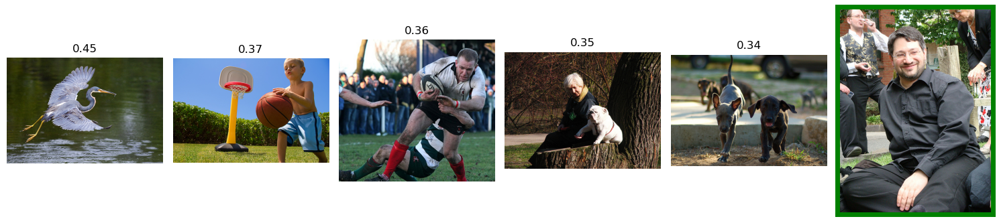

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

-------------------- A white dog with a stick in his mouth standing next to a black dog . --------------------



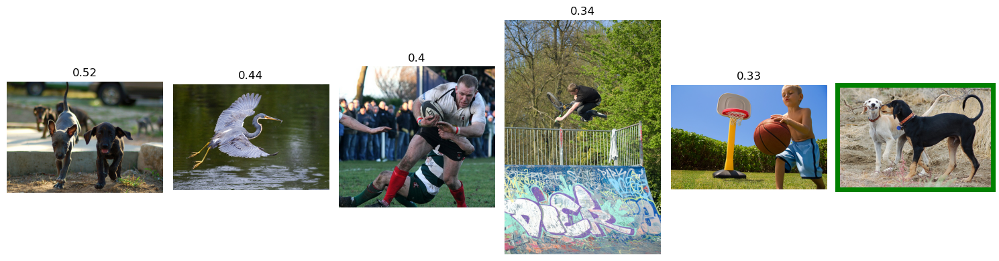


-------------------- Girls wearing sports uniforms and eye protection . --------------------

           This image is unavailable in your country in compliance with local laws.           

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

-------------------- Two women on a movie set reviewing film --------------------



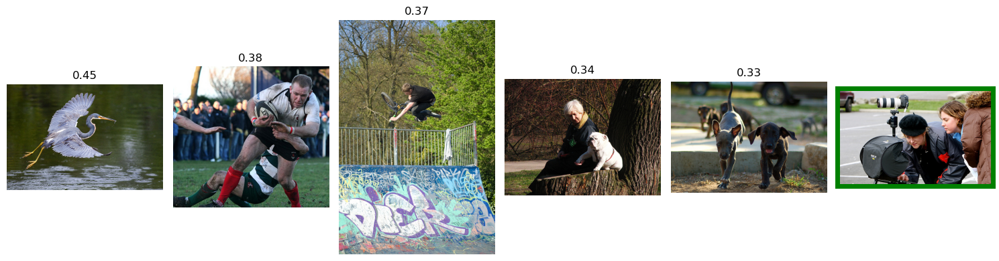

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 

-------------------- Seated man looks out at the ocean . --------------------



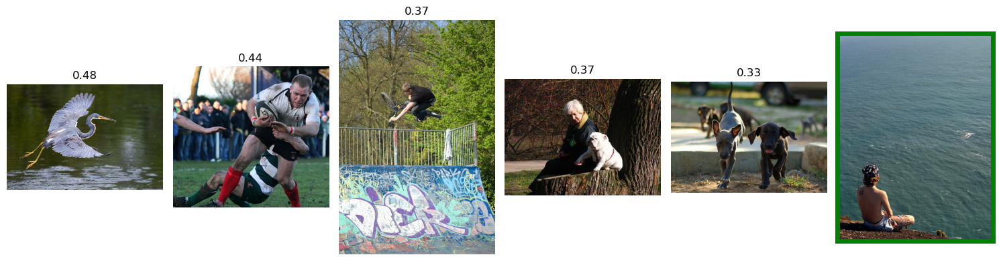

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

-------------------- a man wearing red socks playing running with some other men --------------------



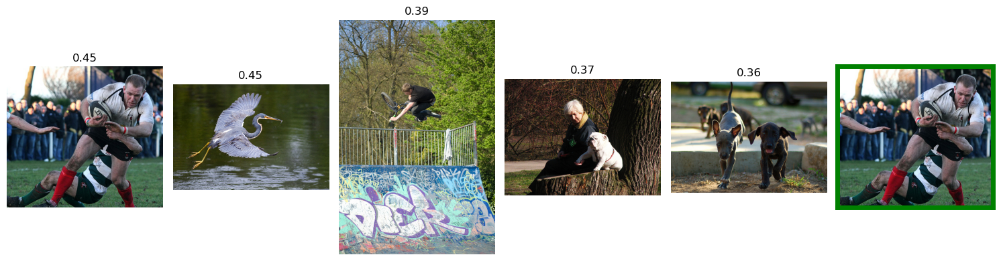

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 

-------------------- A white dog runs on brown grass . --------------------



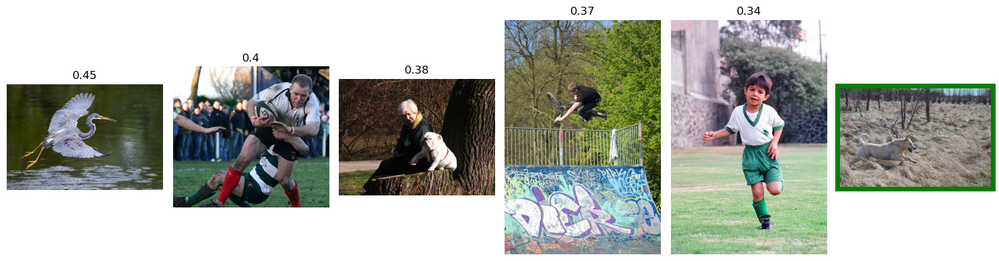

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 

-------------------- Several female lacrosse players are going after a ball . --------------------



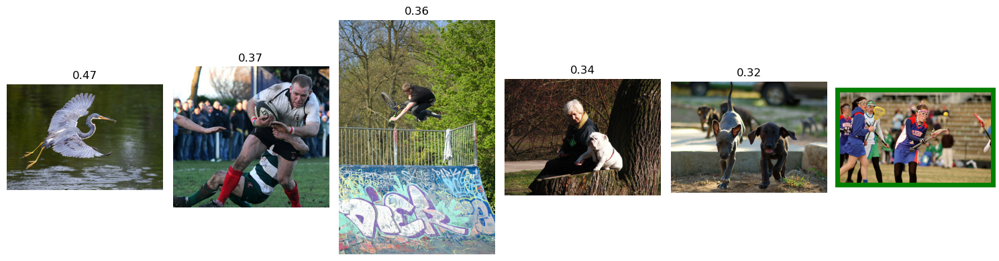


-------------------- little boy playing basketball in the grass --------------------

           This image is unavailable in your country in compliance with local laws.           


-------------------- A boy plays basketball . --------------------

           This image is unavailable in your country in compliance with local laws.           



In [116]:
# Выберем 10 случайных тестовых описаний картинок и посмотрим на результаты
sample = df_queries.sample(10)
text_test = list(sample['query_text'])
# Запустим нашу функцию
for text in text_test:
    get_picture(text)

In [114]:
#!pip install -q sentence-transformers

In [115]:
#from sentence_transformers import SentenceTransformer

### Вывод
  В результате проведенной работы над датасетом, содержащим экспертные и краудсорсинговые оценки соответствия текста и изображения, были реализованы различные методы агрегации оценок и обработки данных. Основные этапы работы включают:

Анализ и обработка данных:
- Датасеты были проверены на корректность типов данных и отсутствие пропусков или дубликатов.
- Были выявлены значительные несоответствия между изображениями и текстовыми описаниями: 57% по мнению экспертов и 87,75% по мнению краудсорсинга.

Агрегация оценок:
- Были разработаны и проведены эксперементы на двух датасетах: только экспертные оценки и экспертные + краудсорсинговые оценки
- Основой для модели были выбраны экспертные оценки как более качественные.

Удаление данных с детьми:
- Все изображения, содержащие детей, были удалены в соответствии с законодательными требованиями.

Векторизация данных и построение моделей:
- Успешно проведена векторизация изображений с помощью ResNet50 и текста с помощью TF-IDF.
- Построены и оценены 5 моделей машинного обучения: LinearRegression, Ridge, LinearSVR, DecisionTreeRegressor и LGBMRegressor.	
  Наилучшие результаты показала модель LGBMRegressor с MAE 0,1998 и RMSE 0,26.
- Построена и оценена нейросеть. В обучении нейросети достигнуты значительные улучшения: на 177-й эпохе MAE составила 0,0416.
 
Несмотря на высокий дисбаланс в данных, использование качественно аннотированного датасета позволило существенно повысить точность модели. Модель возвращает на выходе вероятность соответствия изображения тексту в диапазоне от 0 до 1 и выполняет поставленную бизнес-задачу. Однако нейросеть имеет ряд недостатков. На мой взгляд, процент совпадения текстового описания и изображения всё ещё остаётся низким, иногда модель ошибается и выдаёт не те изображения.
  
В дальнейшим нашу модель можно улучшить несколькими способами:
1) Расширить и улучшить тренировочный датасет. Сделать его более сбалансированным, увеличив количество фотографий и их описаний. Пригласить дополнительных экспертов для аннотации данных, чтобы избежать предвзятости и ошибок, связанных с человеческим фактором при расчете процента сходства.
2) Применить более мощные нейронные сети для векторизации текста и изображений, что может повысить точность представлений данных и, соответственно, улучшить качество модели.
3) Исследовать и внедрить альтернативные архитектуры нейросетей, которые могут предложить более эффективные решения для задач, связанных с машинным зрением и обработкой естественного языка.